<div>    
<img src="https://user-images.githubusercontent.com/104062440/169532038-d7046899-433a-46ca-bf3f-42bbcf6b2bb3.png" width="500" height="400" align="center"/>
</div>

## Group Number: 30
### Members:
- Rotem Liani

- Ron Steinmetz

- Shahar Turgeman

- Adir Sheri
___
##### Git: https://github.com/rotemliani/data_analytics-project_2022
___

1. [Introduction](#section1)
2. [App Price](#section2)
3. [In App Purchases & Ad Supported Apps](#section3)
4. [Apps Ratings](#section4)

In [206]:
pip install plotly

Note: you may need to restart the kernel to use updated packages.


In [207]:

# Scientific libraries
import numpy as np
import pandas as pd


# Visual libraries
import matplotlib.pyplot as plt
from matplotlib import rcParams
import seaborn as sns

# Helper libraries
from colorama import Fore, Back, Style
import warnings
warnings.filterwarnings('ignore')

# Visual setup
import matplotlib.ticker as ticker
plt.style.use('ggplot')
rcParams['axes.spines.right'] = False
rcParams['axes.spines.top'] = False
rcParams['figure.figsize'] = [12, 9]
rcParams['font.size'] = 16
plt.rc('xtick', labelsize=12)
plt.rc('ytick', labelsize=12)
custom_colors = ['#74a09e','#86c1b2','#98e2c6','#f3c969','#f2a553', '#d96548', '#c14953']
sns.set_palette(custom_colors)
%config InlineBackend.figure_format = 'retina'
%config Completer.use_jedi = False
color = sns.color_palette()

# Pandas options
pd.set_option('max_colwidth', 40)
pd.options.display.max_columns = None  # Possible to limit
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = 'all'

import plotly
plotly.offline.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.figure_factory as ff
import cufflinks as cf
from matplotlib import pyplot as plt
plt.style.use('ggplot')

In [208]:
df = pd.read_csv("https://raw.githubusercontent.com/rotemliani/data_analytics-project_2022/main/Google-Playstore.csv")

### Data Cleaning

<div>
<img src="https://user-images.githubusercontent.com/104170075/169687655-29727ce5-d8a6-4c5c-b46f-76cec7f00192.jpg" width='200'>
<div>

##### changing the data size to Mb and cleaning nan values

In [209]:
df['Size'] = df['Size'].str.replace('M',"",regex=True)
df['Size'] = df['Size'].str.replace(',',"",regex=True)
df['Size'] = df["Size"].str.replace('Varies with device',"0")
df['Size'] = df['Size'].str.replace('k',"",regex=True)
df['Size'] = df['Size'].str.replace('G',"",regex=True)
df['Size'] = pd.to_numeric(df['Size'])
df['Size MB']= df['Size']
df = df.drop(columns='Size')
df = df.dropna(axis=0)

In [210]:
df2 = df.copy()

##### Arrange the categories and merging them into main categories

In [211]:
df2['Category'] = df2['Category'].str.replace('Music & Audio','Music')
df2['Category'] = df2['Category'].str.replace('Educational', 'Education')
df2['Category'] = df2['Category'].str.replace('Word', 'Education')
df2['Category'] = df2['Category'].str.replace('Trivia', 'Education')
df2['Category'] = df2['Category'].str.replace('Trivia', 'Education')
df2['Category'] = df2['Category'].str.replace('Parenting', 'Lifestyle')
df2['Category'] = df2['Category'].str.replace('Casino', 'Strategy')
df2['Category'] = df2['Category'].str.replace('Card', 'Strategy')
df2['Category'] = df2['Category'].str.replace('Comics', 'Books & Reference')
df2['Category'] = df2['Category'].str.replace('House & Home', 'Lifestyle')
df2['Category'] = df2['Category'].str.replace('Beauty', 'Lifestyle')
df2['Category'] = df2['Category'].str.replace('Events', 'Social')
df2['Category'] = df2['Category'].str.replace('Weather', 'News & Magazines')
df2['Category'] = df2['Category'].str.replace('Video Players & Editors', 'Tools')
df2['Category'] = df2['Category'].str.replace('Libraries & Demo', 'Books & Reference')
df2['Category'] = df2['Category'].str.replace('Arcade', 'Games')
df2['Category'] = df2['Category'].str.replace('Board', 'Games')
df2['Category'] = df2['Category'].str.replace('Strategy', 'Games')
df2['Category'] = df2['Category'].str.replace('Racing', 'Games')
df2['Category'] = df2['Category'].str.replace('Puzzle', 'Games')
df2['Category'] = df2['Category'].str.replace('Auto & Vehicles', 'Tools')
df2['Category'] = df2['Category'].str.replace('Role Playing', 'Games')
df2['Category'] = df2['Category'].str.replace('Medical', 'Health & Fitness')
df2['Category'] = df2['Category'].str.replace('Dating', 'Social')
df2['Category'] = df2['Category'].str.replace('Art & Design', 'Lifestyle')
df2['Category'] = df2['Category'].str.replace('Simulation', 'Games')
df2['Category'] = df2['Category'].str.replace('Action', 'Games')
df2['Category'] = df2['Category'].str.replace('Adventure', 'Travel & Local')
df2['Category'] = df2['Category'].str.replace('Photography', 'Lifestyle')
df2['Category'] = df2['Category'].str.replace('Communication', 'Social')
df2['Category'] = df2['Category'].str.replace('Communication', 'Social')
df2['Category'] = df2['Category'].str.replace('Maps & Navigation', 'Tools')

##### Separating between free apps and paid apps

In [212]:
df2['Free'] = df2["Price"] == 0
df_free = df2.loc[df2.Price == 0.00]
df_paid = df2.loc[df2.Price > 0 ]

# Introduction

## General information

#### App sum in each catagory

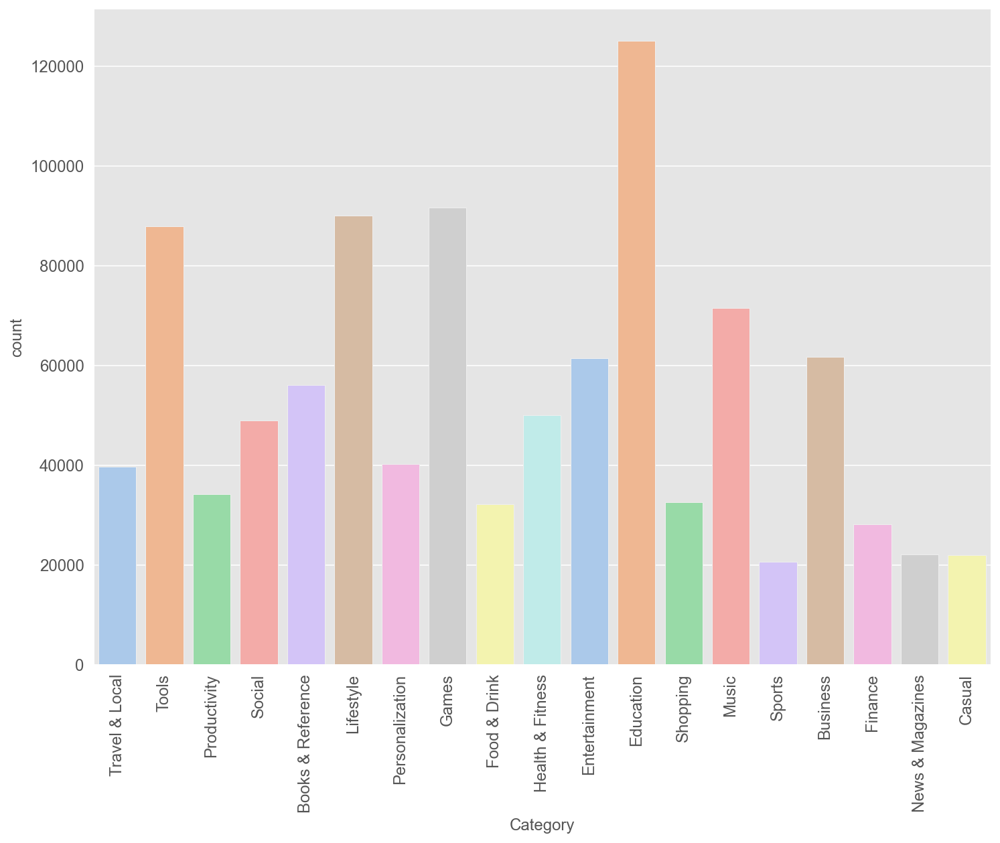

In [213]:
sns.countplot(data=df2, x='Category', palette='pastel')
plt.xticks(rotation=90);

- App sum in total in the play store: 1016448
- App raiting is between 0-5 when 5 is the highest 
- Surprisingly the category with the most apps in the store is educational (127,882) which is quite surprising because category like games are commonly thought to be the highest category
- The category with the least apps in the store is sports and it stands at 21,435 apps in the category

## Installs count by Free and Paid apps

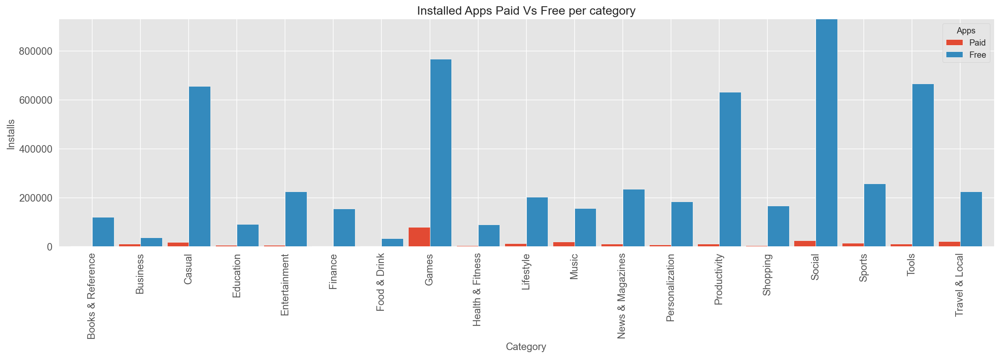

In [214]:
max_piv = df2.pivot_table("Maximum Installs",index ="Category",columns = "Free" )
max_piv.plot.bar(figsize=(20,5),width=0.9)
plt.ylim(0,930000)
plt.title('Installed Apps Paid Vs Free per category')
plt.xlabel('Category')
plt.ylabel('Installs')

plt.legend(title='Apps',labels=["Paid",'Free']);

- The amount of downloads of free apps is significantly greater than paid apps.
- Paid Apps with a high rate of downloads: Games.
- Paid Apps with a low rate of downloads: Social, Books and Finance.
- High download rate (popularity): Social, Games, Productivity and Tools .
- Low download rate: Food and Drink, Health & Fitness and Business.

___

# 1. App Price
in this analysis we will try to show the connection between app prices and their category

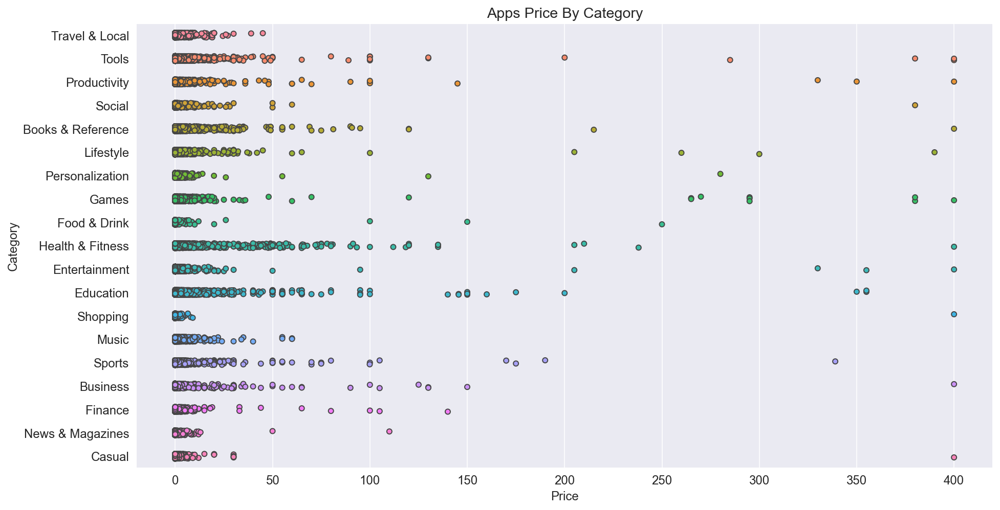

In [215]:
sns.set_style('darkgrid')
fig, ax = plt.subplots()
fig.set_size_inches(15, 8)
p = sns.stripplot(x="Price", y="Category", data=df2, jitter=True, linewidth=1)
title = ax.set_title('Apps Price By Category')

##### We saw that the pricing for most apps is ranged from 0 to 150 usd, as a result of that we zoomed into thr graph to get a better understanding .

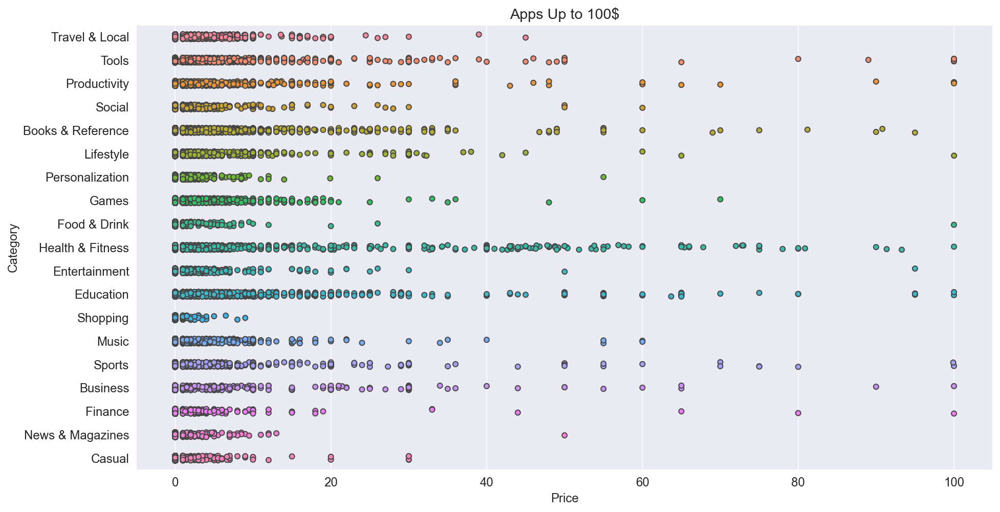

In [216]:
Cheap_Apps = df2[df2.Price<=100]
fig, ax = plt.subplots()
fig.set_size_inches(15, 8)
p = sns.stripplot(x="Price", y="Category", data=Cheap_Apps, jitter=True, linewidth=1)
title = ax.set_title('Apps Up to 100$')

---

## Conclusion

#### Shopping:
- most apps dont cross the 10 usd price <br>
- really small amount of 400 usd price which is very unusual to pay 400 dollars for an app as a private customer  <br>
#### News and Magazines:
- All apps are below 20 usd
#### Health and Fitness:
- unlike the other catagorys, prices are fluctuating between 0 to 60 usd

#### In general we can see that most app prices averege between 0 to 15 usd

___

# 2. In App Purchases & Ad Supported Apps
In this analysis we will try to compare between in In App Purchases and Ads inside apps in different categorys in free apps.
___

<div>
<img src="https://user-images.githubusercontent.com/104170075/169687512-009b510f-0bb3-492c-a8b6-3fa4d964a3aa.jpg" width='450'>
<div>

#### Free Games

In [217]:
game = df_free.loc[df_free.Category == 'Games']
game_count = game['App Name'].count()


in_app = game.loc[game.iloc[:,-3] == True]
in_app = in_app.value_counts("In App Purchases")
in_app = pd.DataFrame((in_app/game_count)*100)

in_ad = game.loc[game.iloc[:,-4] == True]
in_ad = in_ad.value_counts("Ad Supported")
in_ad = pd.DataFrame((in_ad/game_count)*100)

both = [in_app,in_ad]
both = pd.concat(both).T
both['In App Purchases %'] = both.iloc[:,0]
both['Ads %']=both.iloc[:,1]
both = both.drop(columns= True)
both = both.rename(index = {0:"Games"})
both

,In App Purchases %,Ads %
Games,27.512611,81.73299


##### Game apps Income:
- 81% Ad Supported
- 27% In App Purchases

Game apps are based on ads income such as coins, life, level boosters etc..

<div>
<img src="https://user-images.githubusercontent.com/104170081/169676144-707ed827-1b60-4529-a630-0e2bd772d84c.png" width="700">
</div>

___

In [218]:
shop = df_free.loc[df_free.Category == 'Shopping']
shop_count = shop['App Name'].count()

in_app_s = shop.loc[shop.iloc[:,-3] == True]
in_app_s = in_app_s.value_counts("In App Purchases")
in_app_s = pd.DataFrame((in_app_s/shop_count)*100)

in_ad_s = shop.loc[shop.iloc[:,-4] == True]
in_ad_s = in_ad_s.value_counts("Ad Supported")
in_ad_s = pd.DataFrame((in_ad_s/shop_count)*100)

both_s=  [in_app_s,in_ad_s]
both_s = pd.concat(both_s).T
both_s['In App Purchases %'] = both_s.iloc[:,0]
both_s['Ads %']=both_s.iloc[:,1]
both_s = both_s.drop(columns= True)
both_s = both_s.rename(index = {0:"Shopping"})
both_s

,In App Purchases %,Ads %
Shopping,0.905186,14.516723


##### Shopping apps Income:
- 14% Ad Supported
- 0.9% In App Purchases

Shopping apps are not base on ads or In App Purchases as the main income.<br>
Shopping apps as general are ad apps by themselfs and the app is main purpose is around in app Purchases and as a result of that, thats their main profit source.

<div>
<img src="https://user-images.githubusercontent.com/104170081/169676297-bfdcefbc-d530-42b8-bfc5-6f16c6a722ba.png" width="700">
</div>

___

## Conclusion

#### Each category have a different Business model for their profit according to the purpose of the use of the app.

___

# 3. Apps Ratings

## Apps Ratings By Categorys

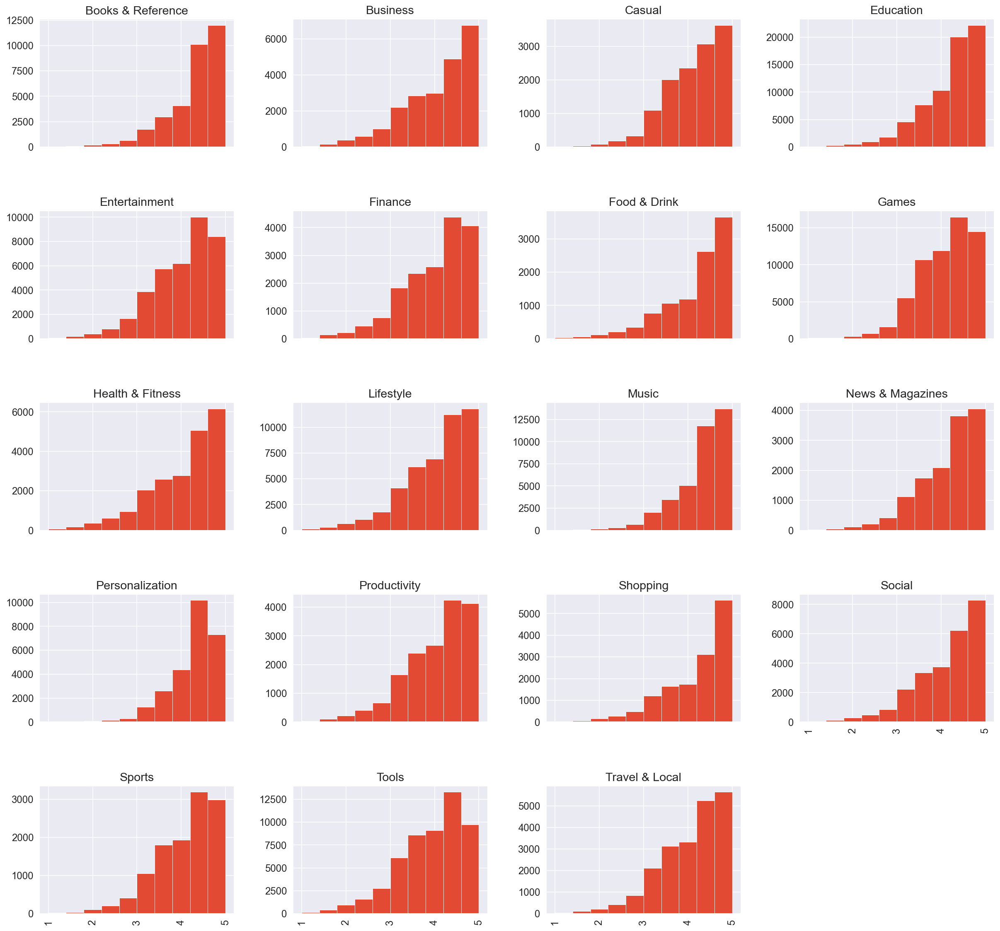

In [219]:
Rating_Above_0 = df2[df2.Rating>0]
groups = Rating_Above_0.groupby('Category').filter(lambda x: len(x) > 286).reset_index()
array = groups['Rating'].hist(by=groups['Category'], sharex=True, figsize=(20,20))

### We can see that the average raitings of apps is changing according to the category it belongs to
in <b>Shopping</b> most of the apps is rated as 5, unlike in the <b>Tools</b> category which we can see that the rating is alot more divergent and for most apps the raiting is between the range of 3-5. 

___

## Does In App Purcheses and Ads have an effect on the App Raiting?

In [220]:
in_app = Rating_Above_0.loc[Rating_Above_0.iloc[:,-3] == True]
in_ad = Rating_Above_0.loc[Rating_Above_0.iloc[:,-4] == True]
free_free_apps = Rating_Above_0.loc[(Rating_Above_0.iloc[:,-4] == False) | (Rating_Above_0.iloc[:,-5] == False)]

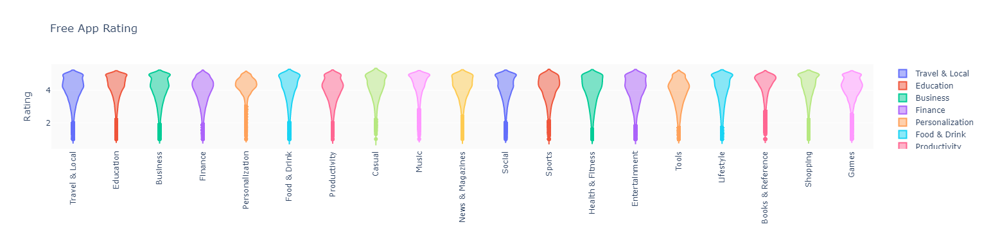

In [221]:
groups = free_free_apps.groupby(['Category'],as_index=False).mean()
layout = {'title' : 'Free App Rating','xaxis': {'tickangle':-90},'yaxis': {'title': 'Rating'},
        'plot_bgcolor': 'rgb(250,250,250)'}
data = [{'y': free_free_apps.loc[free_free_apps.Category==Category]['Rating'], 'type':'violin','name' : Category,
        'showlegend':True,} for i,Category in enumerate(list(set(groups.Category)))]
plotly.offline.iplot({'data': data, 'layout': layout})

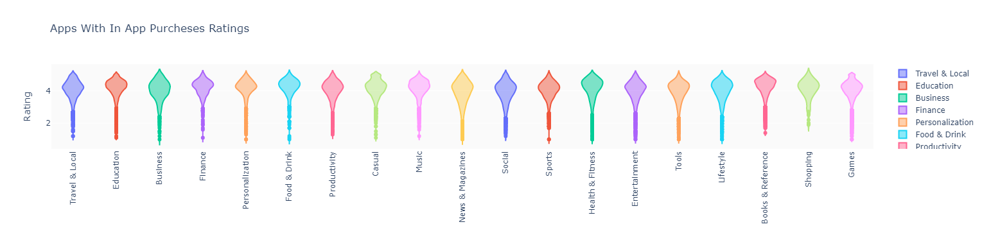

In [222]:
groups = in_app.groupby(['Category'],as_index=False).mean()
layout = {'title' : 'Apps With In App Purcheses Ratings','xaxis': {'tickangle':-90},'yaxis': {'title': 'Rating'},
        'plot_bgcolor': 'rgb(250,250,250)'}
data = [{'y': in_app.loc[in_app.Category==Category]['Rating'], 'type':'violin','name' : Category,
        'showlegend':True,} for i,Category in enumerate(list(set(groups.Category)))]
y = plotly.offline.iplot({'data': data, 'layout': layout})

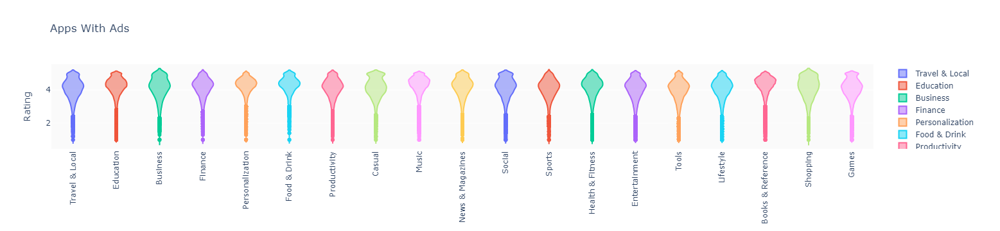

In [223]:
groups = in_ad.groupby(['Category'],as_index=False).mean()
layout = {'title' : 'Apps With Ads','xaxis': {'tickangle':-90},'yaxis': {'title': 'Rating'},
        'plot_bgcolor': 'rgb(250,250,250)'}
data = [{'y': in_ad.loc[in_ad.Category==Category]['Rating'], 'type':'violin','name' : Category,
        'showlegend':True,} for i,Category in enumerate(list(set(groups.Category)))]
z = plotly.offline.iplot({'data': data, 'layout': layout})

#### From here we can see that the rating distribution changes if the app is free or contain in app purcheses or ads

##### Casual median raiting
- Free: 4.4
- With in app purcheses: 4.2
- With ads: 4.2

##### Music median raiting
- Free: 4.5
- With in app purcheses: 4.2
- With ads: 4.4

##### News median raiting
- Free: 4.3
- With in app purcheses: 4
- With ads: 4.2

#### * In app purcheses is the main reason for decrese in the raiting median
#### * Ads dont have a big effect on the raiting median